In [1]:
# Basic Libraries
import numpy as np
import pandas as pd
from datetime import date
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
sb.set() # set the default Seaborn style for graphics

# importing relevant modules and libraries
from bokeh.models import *
from bokeh.plotting import *
from bokeh.io import *
from bokeh.tile_providers import *
from bokeh.palettes import *
from bokeh.transform import *
from bokeh.layouts import *

In [2]:
orders = pd.read_csv('olist_orders_dataset.csv', header = 0)
orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [3]:
order_items = pd.read_csv('olist_order_items_dataset.csv', header = 0)
order_items.head() ##import this dataset for obtaining Price and Freight Value. Also to 
                    ## pair each order_id with a product_id. 

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [4]:
reviews = pd.read_csv('olist_order_reviews_dataset.csv',header=0)
reviews.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


In [5]:
products = pd.read_csv('olist_products_dataset.csv', header = 0)
products.head()## import this dataset for obtaining Weight and Volume of product delivered 

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [6]:
customers = pd.read_csv('olist_customers_dataset.csv',header = 0) 
customers.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [7]:
location = pd.read_csv('olist_geolocation_dataset.csv')
location.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


In [8]:
translation = pd.read_csv('product_category_name_translation copy.csv', header = 0)
translation.head()

,product_category_name,product_category_name_english,Types of products
0,beleza_saude,health_beauty,Fashion
1,informatica_acessorios,computers_accessories,Electronics
2,automotivo,auto,Electronics
3,cama_mesa_banho,bed_bath_table,Household
4,moveis_decoracao,furniture_decor,Furniture


In [9]:
sellers = pd.read_csv('olist_sellers_dataset.csv',header = 0)
sellers.head()

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


In [10]:
order_payments = pd.read_csv('olist_order_payments_dataset.csv' , header = 0)
order_payments.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


After importing all the datasets we need, it's time to clean them. First, we start by dropping some duplicates which we will not need. Then, we will merge all of our datasets together to create a main dataframe where we can work from.

After that, we will drop all of the columns we won't need and get rid of any rows that might have a NaN value. We will also be renaming some of our columns so it is more readable by us humans. 

In [11]:
orders.drop_duplicates(subset='order_id', inplace=True)
order_items.drop_duplicates(subset='order_id', inplace=True)
reviews.drop_duplicates(subset='order_id', inplace=True)
customers.drop_duplicates(subset='customer_id', inplace=True)



In [12]:
maindf = pd.merge(orders, order_items, how='left', left_on='order_id', right_on='order_id')
maindf = pd.merge(maindf, reviews, how='left', left_on='order_id', right_on='order_id')
maindf = pd.merge(maindf, products, how='left', left_on='product_id', right_on='product_id')
maindf = pd.merge(maindf, customers, how='left', left_on='customer_id', right_on='customer_id')
maindf = pd.merge(maindf, location, how='left', left_on='customer_zip_code_prefix', right_on='geolocation_zip_code_prefix')
maindf = pd.merge(maindf,translation, how='left', left_on='product_category_name', right_on='product_category_name')
maindf = pd.merge(maindf,order_payments, how='left', left_on='order_id', right_on='order_id')
maindf.drop_duplicates(subset='order_id', inplace=True) ## for simplicity we want to have one of each order_id.







In [13]:
maindf = pd.merge(maindf,sellers, how='left', left_on = 'seller_id',right_on = 'seller_id')
maindf = pd.merge(maindf,location, how='left',left_on='seller_zip_code_prefix',right_on = 'geolocation_zip_code_prefix')


In [14]:
maindf.drop_duplicates(subset='order_id', inplace=True) ## for simplicity we want to have one of each order_id.

In [15]:

maindf = maindf.rename(columns = {'geolocation_lat_x': 'customer_lat', 'geolocation_lng_x': 'customer_lng', 'geolocation_lat_y':'seller_lat','geolocation_lng_y':'seller_lng'}, inplace = False)

In [17]:
maindf = maindf.drop(columns=['order_approved_at','order_item_id','review_id','review_comment_title', 'review_comment_message',
       'review_creation_date', 'review_answer_timestamp','product_name_lenght',
       'product_description_lenght', 'product_photos_qty','order_approved_at', 'order_delivered_carrier_date','shipping_limit_date','customer_unique_id','customer_city','geolocation_city_y', 'geolocation_state_y','seller_zip_code_prefix', 'seller_city', 'seller_state',
       'geolocation_zip_code_prefix_y','customer_state', 'geolocation_zip_code_prefix_x','customer_zip_code_prefix','geolocation_city_x',
       'geolocation_state_x', 'product_category_name_english','payment_sequential', 'payment_type', 'payment_installments'])

In [18]:
maindf = maindf.dropna()
maindf.reset_index(drop=True,inplace=True)

In [19]:
maindf

,order_id,customer_id,order_status,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date,product_id,seller_id,price,freight_value,...,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_lat,customer_lng,Types of products,payment_value,seller_lat,seller_lng
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-10 21:25:13,2017-10-18 00:00:00,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,8.72,...,500.0,19.0,8.0,13.0,-23.574809,-46.587471,Household,18.12,-23.680114,-46.452454
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-08-07 15:27:45,2018-08-13 00:00:00,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,118.70,22.76,...,400.0,19.0,13.0,19.0,-12.169860,-44.988369,Fashion,141.46,-19.810119,-43.984727
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-17 18:06:29,2018-09-04 00:00:00,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,159.90,19.22,...,420.0,24.0,19.0,21.0,-16.746337,-48.514624,Electronics,179.12,-21.362358,-48.232976
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-12-02 00:28:42,2017-12-15 00:00:00,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,45.00,27.20,...,450.0,30.0,10.0,20.0,-5.767733,-35.275467,Household,72.20,-19.840168,-43.923299
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-16 18:17:02,2018-02-26 00:00:00,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,19.90,8.72,...,250.0,51.0,15.0,15.0,-23.675037,-46.524784,Household,28.62,-23.551707,-46.260979
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94619,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-17 15:08:01,2017-03-28 00:00:00,ac35486adb7b02598c182c2ff2e05254,e24fc9fcd865784fb25705606fe3dfe7,72.00,13.08,...,1175.0,22.0,13.0,18.0,-23.178732,-45.889711,Fashion,85.08,-22.957505,-46.524886
94620,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-28 17:37:56,2018-03-02 00:00:00,f1d4ce8c6dd66c47bbaa8c6781c2a923,1f9ab4708f3056ede07124aad39a2554,174.90,20.10,...,4950.0,40.0,10.0,40.0,-24.001467,-46.446355,Household,195.00,-21.935321,-50.497562
94621,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-09-21 11:24:17,2017-09-27 00:00:00,b80910977a37536adeddd63663f916ad,d50d79cb34e38265a8649c383dcffd48,205.99,65.02,...,13300.0,32.0,90.0,22.0,-17.891522,-39.370942,Tools,271.01,-23.551013,-46.448489
94622,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-25 23:32:54,2018-02-15 00:00:00,d1c427060a0f73f6b889a5c7c61f2ac4,a1043bafd471dff536d0c462352beb48,179.99,40.59,...,6550.0,20.0,20.0,20.0,-22.555985,-42.690761,Electronics,441.16,-20.944706,-45.827098


Below is our attempt at getting the delivery days taken for each delivery. Since the format for the date and time was together in our dataset, we have to split each row one by one in order to use python's datetime module.

Then we repeat these steps for estimated days taken for delivery as well. 

We also use the 3 values of height,width and length to get volume.

In [20]:
for index in range(0,30000): ## first 30000 rows 
    if (maindf.loc[index,'order_status'] == 'delivered') and (type(orders.loc[index,'order_purchase_timestamp']) == str) and (type(orders.loc[index,'order_delivered_customer_date']) == str) and (index != 3002):
        buy = maindf.loc[index,'order_purchase_timestamp']
        l = buy.split()
        maindf.loc[index,'bought'] = l[0]
        
        got = maindf.loc[index,'order_delivered_customer_date']
        l2 = got.split()
        maindf.loc[index,'delivered'] = l2[0]
        
        estimate = maindf.loc[index,'order_estimated_delivery_date']
        l3 = estimate.split()
        maindf.loc[index,'estimate'] = l3[0]
        
        volume = maindf.loc[index,'product_length_cm'] * maindf.loc[index,'product_height_cm'] * maindf.loc[index,'product_width_cm']
        maindf.loc[index,'volume'] = volume
        
        

In [21]:
maindf = maindf.dropna()
maindf.reset_index(drop=True,inplace=True)
maindf

,order_id,customer_id,order_status,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date,product_id,seller_id,price,freight_value,...,customer_lat,customer_lng,Types of products,payment_value,seller_lat,seller_lng,bought,delivered,estimate,volume
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-10 21:25:13,2017-10-18 00:00:00,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,8.72,...,-23.574809,-46.587471,Household,18.12,-23.680114,-46.452454,2017-10-02,2017-10-10,2017-10-18,1976.0
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-08-07 15:27:45,2018-08-13 00:00:00,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,118.70,22.76,...,-12.169860,-44.988369,Fashion,141.46,-19.810119,-43.984727,2018-07-24,2018-08-07,2018-08-13,4693.0
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-17 18:06:29,2018-09-04 00:00:00,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,159.90,19.22,...,-16.746337,-48.514624,Electronics,179.12,-21.362358,-48.232976,2018-08-08,2018-08-17,2018-09-04,9576.0
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-12-02 00:28:42,2017-12-15 00:00:00,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,45.00,27.20,...,-5.767733,-35.275467,Household,72.20,-19.840168,-43.923299,2017-11-18,2017-12-02,2017-12-15,6000.0
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-16 18:17:02,2018-02-26 00:00:00,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,19.90,8.72,...,-23.675037,-46.524784,Household,28.62,-23.551707,-46.260979,2018-02-13,2018-02-16,2018-02-26,11475.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29115,d4bc0ad85ade29acdd0a51c7ce9367b1,2f77504d95a71ffa709d5a8939e384e2,delivered,2018-08-15 18:44:40,2018-08-22 00:42:03,2018-08-28 00:00:00,f58bb9f12b0ca10029de2df4585a353f,46dc3b2cc0980fb8ec44634e21d2718e,99.99,18.64,...,-15.832476,-48.010334,Household,118.63,-22.931256,-43.178813,2018-08-15,2018-08-22,2018-08-28,22500.0
29116,c52e9809d37cb1da882dc573f4240878,d2a568db82977556bb2acd4ed397b59f,delivered,2017-05-05 19:36:29,2017-05-15 15:13:57,2017-06-01 00:00:00,554fc36c06624912230e7355ab7be734,1127b7f2594683f2510f1c2c834a486b,37.55,16.05,...,-30.024860,-51.223432,Tools,53.60,-22.852758,-47.055102,2017-05-05,2017-05-15,2017-06-01,1188.0
29117,5d6b252b7498a940c9faa592213429e6,2a88f869ff60c357f6e00e6dded4442f,delivered,2017-04-03 22:00:31,2017-04-19 14:24:05,2017-05-04 00:00:00,b0961721fd839e9982420e807758a2a6,1f50f920176fa81dab994f9023523100,59.90,17.16,...,-19.612724,-46.924422,Tools,308.24,-20.802436,-49.395624,2017-04-03,2017-04-19,2017-05-04,32560.0
29118,f8573b9bf02d001ec2885d6c8193a436,2497f94fd70c1ceb3b57e5c194efc4d2,delivered,2017-10-31 13:30:47,2017-11-13 15:32:46,2017-11-21 00:00:00,f35927953ed82e19d06ad3aac2f06353,669ae81880e08f269a64487cfb287169,115.00,17.25,...,-22.912294,-43.382198,Household,132.25,-27.209811,-49.632920,2017-10-31,2017-11-13,2017-11-21,8000.0


In [22]:
for index in range(0,29120): 
    bought_date = maindf.loc[index,'bought']
    l = bought_date.split('-')
    maindf.loc[index,'year'] = l[0]
    maindf.loc[index,'month'] = l[1]
    maindf.loc[index,'day'] = l[2]
    
    delivery_date = maindf.loc[index,'delivered']
    l2 = delivery_date.split('-')
    maindf.loc[index,'year2'] = l2[0]
    maindf.loc[index,'month2'] = l2[1]
    maindf.loc[index,'day2'] = l2[2]
    
    estimated_date = maindf.loc[index,'estimate']
    l3 = estimated_date.split('-')
    maindf.loc[index,'year3'] = l3[0]
    maindf.loc[index,'month3'] = l3[1]
    maindf.loc[index,'day3'] = l3[2]

/Users/chintaiann/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1598: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = infer_fill_value(value)
/Users/chintaiann/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1719: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


In [23]:
for index in range(0,29120): 
    year = int(maindf.loc[index,'year'])
    month = int(maindf.loc[index,'month'])
    day = int(maindf.loc[index,'day'])
    
    year2 = int(maindf.loc[index,'year2'])
    month2 = int(maindf.loc[index,'month2'])
    day2 = int(maindf.loc[index,'day2'])
    
    date1 = date(year,month,day)
    date2 = date(year2,month2,day2)
    
    year3 = int(maindf.loc[index,'year3'])
    month3 = int(maindf.loc[index,'month3'])
    day3 = int(maindf.loc[index,'day3'])
    
    date3 = date(year3,month3,day3)
    
    maindf.loc[index,'delivery_days'] = (date2-date1).days
    maindf.loc[index,'estimated_days'] = (date3-date1).days

In [24]:
maindf

,order_id,customer_id,order_status,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date,product_id,seller_id,price,freight_value,...,month,day,year2,month2,day2,year3,month3,day3,delivery_days,estimated_days
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-10 21:25:13,2017-10-18 00:00:00,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,8.72,...,10,02,2017,10,10,2017,10,18,8.0,16.0
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-08-07 15:27:45,2018-08-13 00:00:00,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,118.70,22.76,...,07,24,2018,08,07,2018,08,13,14.0,20.0
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-17 18:06:29,2018-09-04 00:00:00,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,159.90,19.22,...,08,08,2018,08,17,2018,09,04,9.0,27.0
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-12-02 00:28:42,2017-12-15 00:00:00,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,45.00,27.20,...,11,18,2017,12,02,2017,12,15,14.0,27.0
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-16 18:17:02,2018-02-26 00:00:00,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,19.90,8.72,...,02,13,2018,02,16,2018,02,26,3.0,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29115,d4bc0ad85ade29acdd0a51c7ce9367b1,2f77504d95a71ffa709d5a8939e384e2,delivered,2018-08-15 18:44:40,2018-08-22 00:42:03,2018-08-28 00:00:00,f58bb9f12b0ca10029de2df4585a353f,46dc3b2cc0980fb8ec44634e21d2718e,99.99,18.64,...,08,15,2018,08,22,2018,08,28,7.0,13.0
29116,c52e9809d37cb1da882dc573f4240878,d2a568db82977556bb2acd4ed397b59f,delivered,2017-05-05 19:36:29,2017-05-15 15:13:57,2017-06-01 00:00:00,554fc36c06624912230e7355ab7be734,1127b7f2594683f2510f1c2c834a486b,37.55,16.05,...,05,05,2017,05,15,2017,06,01,10.0,27.0
29117,5d6b252b7498a940c9faa592213429e6,2a88f869ff60c357f6e00e6dded4442f,delivered,2017-04-03 22:00:31,2017-04-19 14:24:05,2017-05-04 00:00:00,b0961721fd839e9982420e807758a2a6,1f50f920176fa81dab994f9023523100,59.90,17.16,...,04,03,2017,04,19,2017,05,04,16.0,31.0
29118,f8573b9bf02d001ec2885d6c8193a436,2497f94fd70c1ceb3b57e5c194efc4d2,delivered,2017-10-31 13:30:47,2017-11-13 15:32:46,2017-11-21 00:00:00,f35927953ed82e19d06ad3aac2f06353,669ae81880e08f269a64487cfb287169,115.00,17.25,...,10,31,2017,11,13,2017,11,21,13.0,21.0


In [25]:
maindf.columns

Index(['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'product_id', 'seller_id', 'price', 'freight_value', 'review_score',
       'product_category_name', 'product_weight_g', 'product_length_cm',
       'product_height_cm', 'product_width_cm', 'customer_lat', 'customer_lng',
       'Types of products', 'payment_value', 'seller_lat', 'seller_lng',
       'bought', 'delivered', 'estimate', 'volume', 'year', 'month', 'day',
       'year2', 'month2', 'day2', 'year3', 'month3', 'day3', 'delivery_days',
       'estimated_days'],
      dtype='object')

In [26]:
maindf = maindf.drop(columns=['order_status','order_purchase_timestamp','order_delivered_customer_date', 'order_estimated_delivery_date','bought', 'delivered', 'estimate','month', 'day', 'year2',
       'month2', 'day2', 'year3', 'month3', 'day3','order_id', 'customer_id','product_id', 'seller_id','product_category_name','product_length_cm',
       'product_height_cm', 'product_width_cm'])

In [27]:
maindf

,price,freight_value,review_score,product_weight_g,customer_lat,customer_lng,Types of products,payment_value,seller_lat,seller_lng,volume,year,delivery_days,estimated_days
0,29.99,8.72,4,500.0,-23.574809,-46.587471,Household,18.12,-23.680114,-46.452454,1976.0,2017,8.0,16.0
1,118.70,22.76,4,400.0,-12.169860,-44.988369,Fashion,141.46,-19.810119,-43.984727,4693.0,2018,14.0,20.0
2,159.90,19.22,5,420.0,-16.746337,-48.514624,Electronics,179.12,-21.362358,-48.232976,9576.0,2018,9.0,27.0
3,45.00,27.20,5,450.0,-5.767733,-35.275467,Household,72.20,-19.840168,-43.923299,6000.0,2017,14.0,27.0
4,19.90,8.72,5,250.0,-23.675037,-46.524784,Household,28.62,-23.551707,-46.260979,11475.0,2018,3.0,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29115,99.99,18.64,5,1400.0,-15.832476,-48.010334,Household,118.63,-22.931256,-43.178813,22500.0,2018,7.0,13.0
29116,37.55,16.05,5,300.0,-30.024860,-51.223432,Tools,53.60,-22.852758,-47.055102,1188.0,2017,10.0,27.0
29117,59.90,17.16,5,1850.0,-19.612724,-46.924422,Tools,308.24,-20.802436,-49.395624,32560.0,2017,16.0,31.0
29118,115.00,17.25,4,450.0,-22.912294,-43.382198,Household,132.25,-27.209811,-49.632920,8000.0,2017,13.0,21.0


Here we save our main dataframe which we will include in our submission. Then we won't have to run the above code more than once. 

In [28]:
maindf.to_csv(r'/Users/chintaiann/Desktop/ExportDataFrame.csv', index = False)


## Start of Exploratory Analysis 
###  From now on, we can just import the dataset we have created instead of going through the above steps. 
### Start running code from here!

In [29]:
dataframe = pd.read_csv('ExportDataFrame.csv', header = 0)
dataframe.head()



,price,freight_value,review_score,product_weight_g,customer_lat,customer_lng,Types of products,payment_value,seller_lat,seller_lng,volume,year,delivery_days,estimated_days
0,29.99,8.72,4,500.0,-23.574809,-46.587471,Household,18.12,-23.680114,-46.452454,1976.0,2017,8.0,16.0
1,118.70,22.76,4,400.0,-12.169860,-44.988369,Fashion,141.46,-19.810119,-43.984727,4693.0,2018,14.0,20.0
2,159.90,19.22,5,420.0,-16.746337,-48.514624,Electronics,179.12,-21.362358,-48.232976,9576.0,2018,9.0,27.0
3,45.00,27.20,5,450.0,-5.767733,-35.275467,Household,72.20,-19.840168,-43.923299,6000.0,2017,14.0,27.0
4,19.90,8.72,5,250.0,-23.675037,-46.524784,Household,28.62,-23.551707,-46.260979,11475.0,2018,3.0,13.0


### Let's start with our numerical factors : Price, Freight Value, Review Score, Volume and Weight. 


In [4]:
pricedf = pd.DataFrame(dataframe['price'])
freightdf = pd.DataFrame(dataframe['freight_value'])
volumedf = pd.DataFrame(dataframe['volume'])
weightdf = pd.DataFrame(dataframe['product_weight_g'])
reviewdf = pd.DataFrame(dataframe['review_score'])
daysdf = pd.DataFrame(dataframe['delivery_days'])

First we can take a look at uni-variate analysis of our factors. After that, we can compare each of our factors to the days taken for delivery - bivariate analysis. 

<AxesSubplot:>

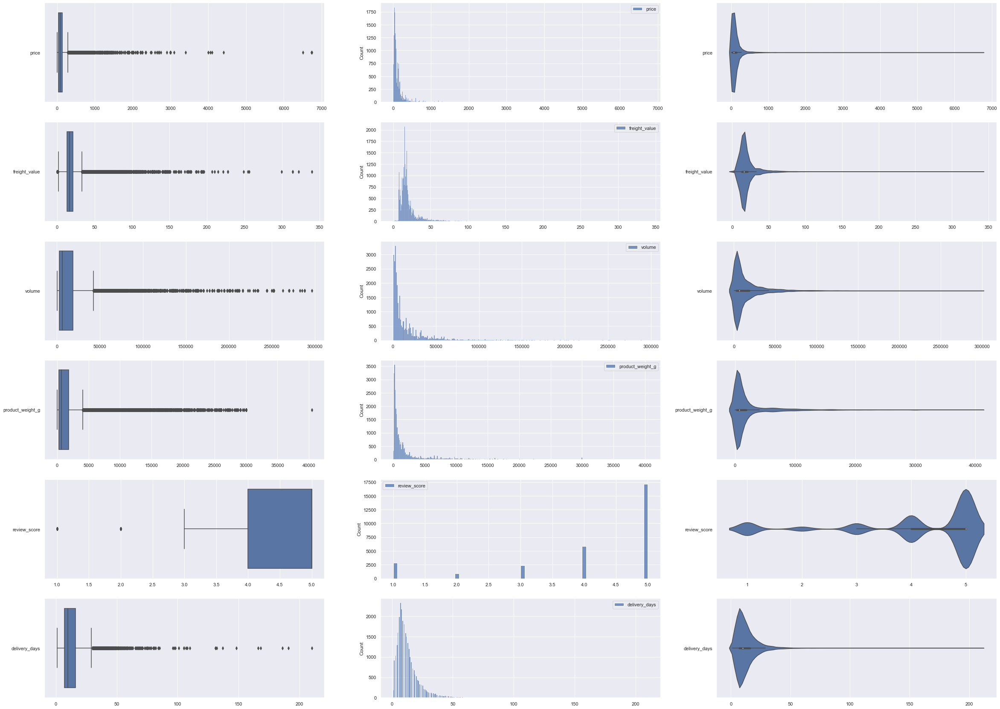

In [5]:
f, axes = plt.subplots(6, 3, figsize=(40, 30))


sb.boxplot(data = pricedf, orient = "h", ax = axes[0,0])
sb.histplot(data = pricedf, ax = axes[0,1])
sb.violinplot(data = pricedf, orient = "h", ax = axes[0,2])


sb.boxplot(data = freightdf, orient = "h", ax = axes[1,0])
sb.histplot(data = freightdf, ax = axes[1,1])
sb.violinplot(data = freightdf, orient = "h", ax = axes[1,2])

sb.boxplot(data = volumedf, orient = "h", ax = axes[2,0])
sb.histplot(data = volumedf, ax = axes[2,1])
sb.violinplot(data = volumedf, orient = "h", ax = axes[2,2])

sb.boxplot(data = weightdf, orient = "h", ax = axes[3,0])
sb.histplot(data = weightdf, ax = axes[3,1])
sb.violinplot(data = weightdf, orient = "h", ax = axes[3,2])

sb.boxplot(data = reviewdf, orient = "h", ax = axes[4,0])
sb.histplot(data = reviewdf, ax = axes[4,1])
sb.violinplot(data =reviewdf, orient = "h", ax = axes[4,2])

sb.boxplot(data = daysdf, orient = "h", ax = axes[5,0])
sb.histplot(data = daysdf, ax = axes[5,1])
sb.violinplot(data = daysdf, orient = "h", ax = axes[5,2])

,delivery_days,price
delivery_days,1.000000,0.055548
price,0.055548,1.000000


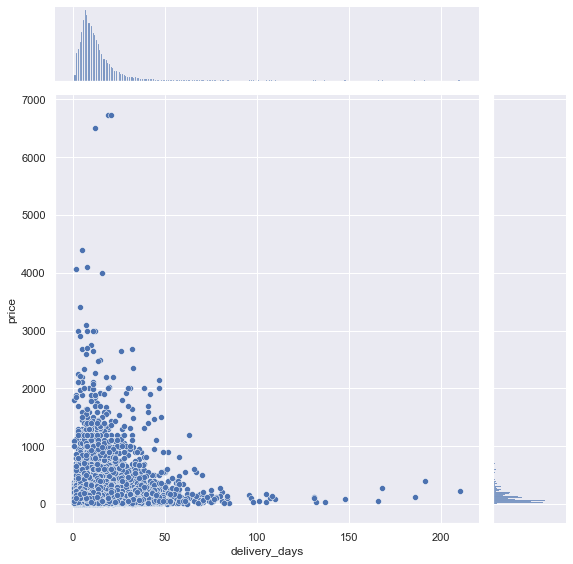

In [6]:
jointDF = pd.concat([daysdf,pricedf], axis = 1)
sb.jointplot(data = jointDF, x = "delivery_days", y = "price", height = 8)
jointDF.corr()

,delivery_days,freight_value
delivery_days,1.000000,0.220237
freight_value,0.220237,1.000000


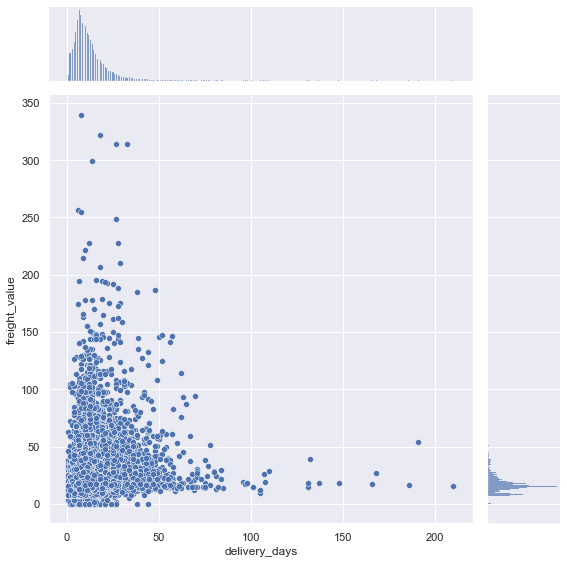

In [7]:
jointDF = pd.concat([daysdf,freightdf], axis = 1)
sb.jointplot(data = jointDF, x = "delivery_days", y = "freight_value", height = 8)
jointDF.corr()

,delivery_days,volume
delivery_days,1.000000,0.077924
volume,0.077924,1.000000


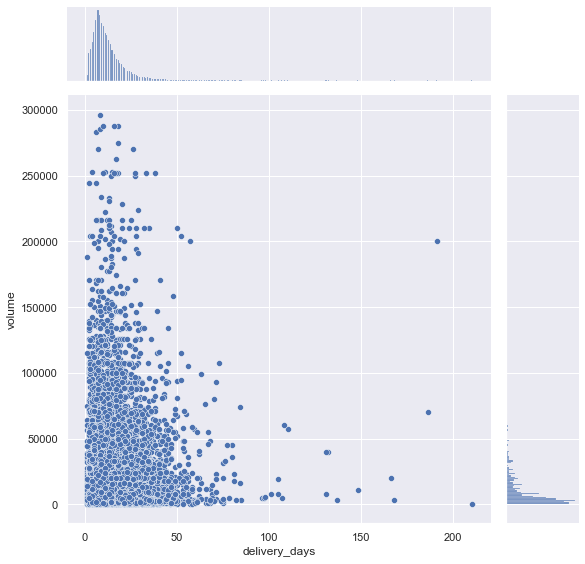

In [8]:
jointDF = pd.concat([daysdf,volumedf], axis = 1)
sb.jointplot(data = jointDF, x = "delivery_days", y = "volume", height = 8)
jointDF.corr()

,delivery_days,product_weight_g
delivery_days,1.000000,0.085446
product_weight_g,0.085446,1.000000


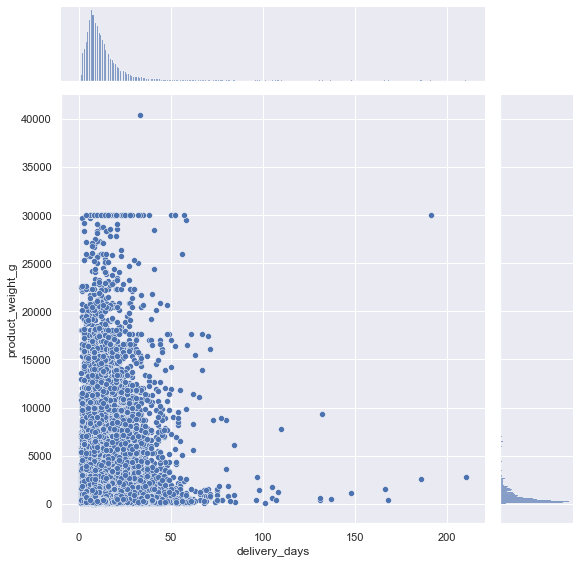

In [9]:
jointDF = pd.concat([daysdf,weightdf], axis = 1)
sb.jointplot(data = jointDF, x = "delivery_days", y = "product_weight_g", height = 8)
jointDF.corr()

,delivery_days,review_score
delivery_days,1.000000,-0.338064
review_score,-0.338064,1.000000


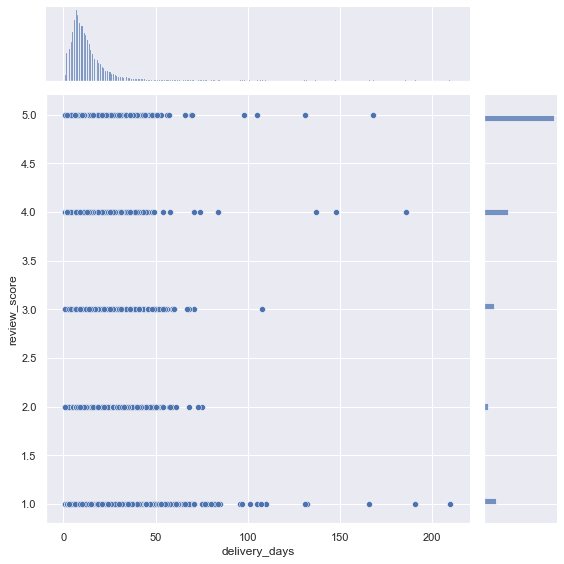

In [10]:
jointDF = pd.concat([daysdf,reviewdf], axis = 1)
sb.jointplot(data = jointDF, x = "delivery_days", y = "review_score", height = 8)
jointDF.corr()

From our bi-variate data analysis from above, we can see that correlation is fairly low for all of our factors. 
The highest would be 0.22 for freight value and -0.34 for our review score. 

In [11]:
numDF = pd.DataFrame(dataframe[['delivery_days','price','volume','product_weight_g','freight_value','review_score']])

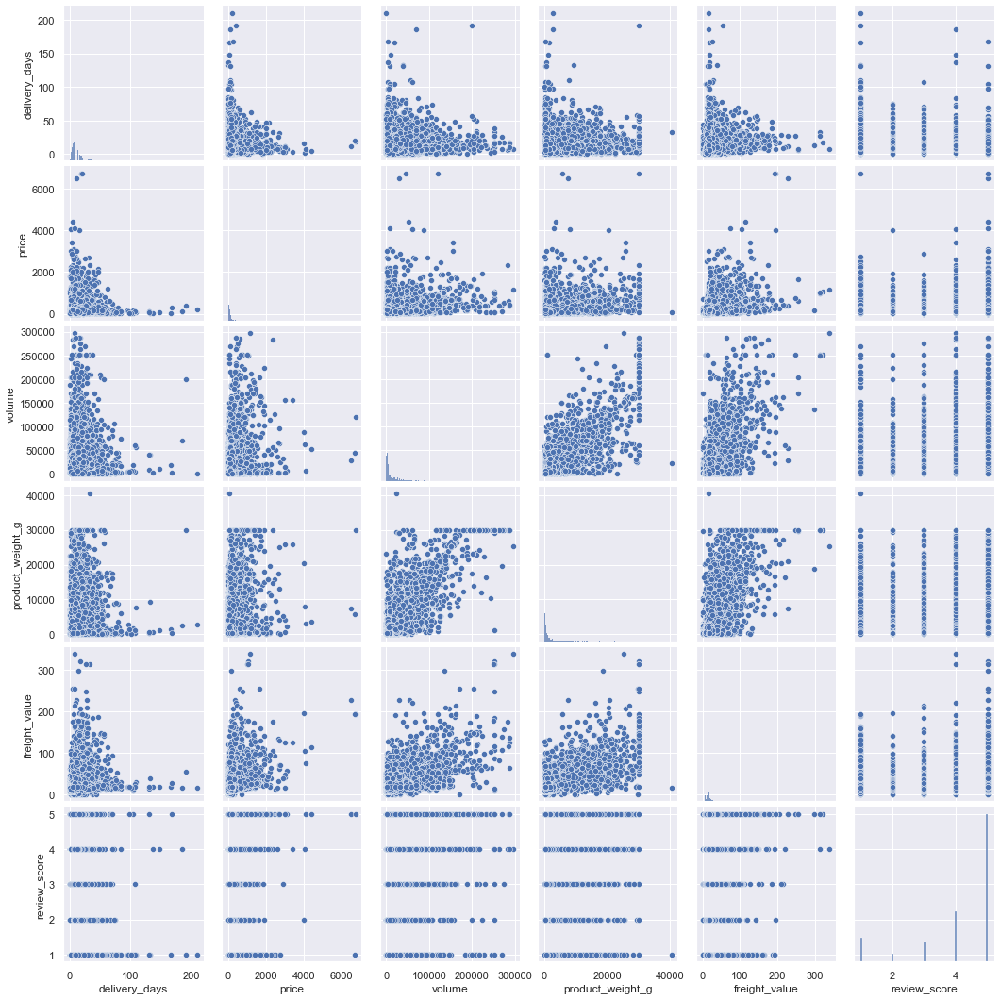

In [12]:
sb.pairplot(data = numDF)

<AxesSubplot:>

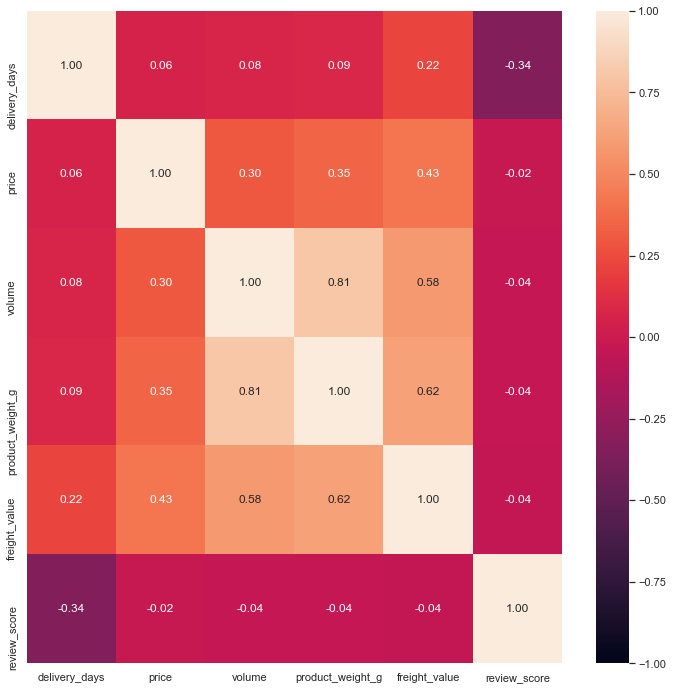

In [13]:
f = plt.figure(figsize=(12, 12))
sb.heatmap(numDF.corr(), vmin = -1, vmax = 1, annot = True, fmt = ".2f")

By comparing all our variables against each other, we can gain more insight into how each of them affect another. 
Interestingly enough, review score does not seem to correlate much to all our other factors, except days taken for delivery. 



## Something Extra : Analyzing Geospatial Data 
### Here we use Bokeh Maps to visualize the sellers' and buyers' location on a map, using just their longitutde and latitude. 

In [21]:
dataframe

,price,freight_value,review_score,product_weight_g,customer_lat,customer_lng,Types of products,payment_value,seller_lat,seller_lng,volume,year,delivery_days,estimated_days
0,29.99,8.72,4,500.0,-23.574809,-46.587471,Household,18.12,-23.680114,-46.452454,1976.0,2017,8.0,16.0
1,118.70,22.76,4,400.0,-12.169860,-44.988369,Fashion,141.46,-19.810119,-43.984727,4693.0,2018,14.0,20.0
2,159.90,19.22,5,420.0,-16.746337,-48.514624,Electronics,179.12,-21.362358,-48.232976,9576.0,2018,9.0,27.0
3,45.00,27.20,5,450.0,-5.767733,-35.275467,Household,72.20,-19.840168,-43.923299,6000.0,2017,14.0,27.0
4,19.90,8.72,5,250.0,-23.675037,-46.524784,Household,28.62,-23.551707,-46.260979,11475.0,2018,3.0,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29115,99.99,18.64,5,1400.0,-15.832476,-48.010334,Household,118.63,-22.931256,-43.178813,22500.0,2018,7.0,13.0
29116,37.55,16.05,5,300.0,-30.024860,-51.223432,Tools,53.60,-22.852758,-47.055102,1188.0,2017,10.0,27.0
29117,59.90,17.16,5,1850.0,-19.612724,-46.924422,Tools,308.24,-20.802436,-49.395624,32560.0,2017,16.0,31.0
29118,115.00,17.25,4,450.0,-22.912294,-43.382198,Household,132.25,-27.209811,-49.632920,8000.0,2017,13.0,21.0


In [30]:
# setting longitiude and latitude coordinates as type float, to ensure data integrity
dataframe['customer_lat'] = dataframe['customer_lat'].astype('float')
dataframe['customer_lng']= dataframe['customer_lng'].astype('float')
dataframe['seller_lat']= dataframe['seller_lat'].astype('float')
dataframe['seller_lng']= dataframe['seller_lng'].astype('float')

## Have to run the code to show a dynamic map. We have included some screenshots of the maps below so there is no need to run the code from above. 

In [38]:
#Bokeh maps are in mercator. Convert lat lon fields to mercator units for plotting

def wgs84_to_web_mercator(df, lon, lat):
    k = 6378137
    df["x"] = df[lon] * (k * np.pi/180.0)
    df["y"] = np.log(np.tan((90 + df[lat]) * np.pi/360.0)) * k
    return df

df=wgs84_to_web_mercator(dataframe,'customer_lng','customer_lat')

#Establishing a zoom scale for the map. The scale variable will also determine proportions for hexbins and bubble maps so that everything looks visually appealing. 

scale=2000
x=df['x']
y=df['y']

#The range for the map extents is derived from the lat/lon fields. This way the map is automatically centered on the plot elements.

x_min=int(x.mean() - (scale * 350))
x_max=int(x.mean() + (scale * 350))
y_min=int(y.mean() - (scale * 350))
y_max=int(y.mean() + (scale * 350))

#Defining the map tiles to use. I use OSM, but you can also use ESRI images or google street maps.

tile_provider=get_provider(OSM)

#Establish the bokeh plot object and add the map tile as an underlay. Hide x and y axis.

plot=figure(
    title='Brazil O-list Sales by location',
    match_aspect=True,
    tools='wheel_zoom,pan,reset,save',
    x_range=(x_min, x_max),
    y_range=(y_min, y_max),
    x_axis_type='mercator',
    y_axis_type='mercator'
    )

plot.grid.visible=True

map=plot.add_tile(tile_provider)
map.level='underlay'

plot.xaxis.visible = False
plot.yaxis.visible=False

#If in Jupyter, use the output_notebook() method to display the plot in-line. If not, you can use output_file() or another method to save your map. 
output_notebook()

#function takes scale (defined above), the initialized plot object, and the converted dataframe with mercator coordinates to create a hexbin map

def hex_map(plot,df, scale,leg_label='Hexbin Heatmap'):
  r,bins=plot.hexbin(x,y,size=scale*0.5,hover_color='pink',hover_alpha=0.2,legend_label=leg_label)
  hex_hover = HoverTool(tooltips=[('count','@c')],mode='mouse',point_policy='follow_mouse',renderers=[r])
  hex_hover.renderers.append(r)
  plot.tools.append(hex_hover)
  
  plot.legend.location = "top_right"
  plot.legend.click_policy="hide"

#function takes a column to determine radius and the dataframe with converted mercator coordinates to create a bubble map. 
def bubble_map(plot,df,radius_col,lon,lat,scale,color='orange',leg_label='Bubble Map'):
  radius=[]
  for i in df[radius_col]:
    radius.append(i*scale)
  
  df['radius']=radius
    
  source=ColumnDataSource(dataframe)
  c=plot.circle(x='x',y='y',color=color,source=source,size=1,fill_alpha=0.4,radius='radius',legend_label=leg_label,hover_color='red')

  tip_label='@'+radius_col
  lat_label='@'+lat
  lon_label='@'+lon

  circle_hover = HoverTool(tooltips=[(radius_col,tip_label),('Lat:',lat_label),('Lon:',lon_label)],mode='mouse',point_policy='follow_mouse',renderers=[c])
  circle_hover.renderers.append(c)
  plot.tools.append(circle_hover)

#The legend.click_policy method allows us to toggle layer on/off by clicking the corresponding field in the legend. We'll explore this more later!
  plot.legend.location = "top_right"
  plot.legend.click_policy="hide"

Loading BokehJS ...

In [39]:
#Create the hexbin map
hex_map(plot=plot,
        df=dataframe, 
        scale=scale,
        leg_label='Sale')

#let's see our handiwork!
show(plot)

In [40]:
#Bokeh maps are in mercator. Convert lat lon fields to mercator units for plotting

def wgs84_to_web_mercator(df, lon, lat):
    k = 6378137
    df["x"] = df[lon] * (k * np.pi/180.0)
    df["y"] = np.log(np.tan((90 + df[lat]) * np.pi/360.0)) * k
    return df

df=wgs84_to_web_mercator(dataframe,'customer_lng','customer_lat')

#Establishing a zoom scale for the map. The scale variable will also determine proportions for hexbins and bubble maps so that everything looks visually appealing. 

scale=2000
x=df['x']
y=df['y']

#The range for the map extents is derived from the lat/lon fields. This way the map is automatically centered on the plot elements.

x_min=int(x.mean() - (scale * 350))
x_max=int(x.mean() + (scale * 350))
y_min=int(y.mean() - (scale * 350))
y_max=int(y.mean() + (scale * 350))

#Defining the map tiles to use. I use OSM, but you can also use ESRI images or google street maps.

tile_provider=get_provider(OSM)

#Establish the bokeh plot object and add the map tile as an underlay. Hide x and y axis.

plot=figure(
    title='Brazil O-list Sales by location',
    match_aspect=True,
    tools='wheel_zoom,pan,reset,save',
    x_range=(x_min, x_max),
    y_range=(y_min, y_max),
    x_axis_type='mercator',
    y_axis_type='mercator'
    )

plot.grid.visible = True

map = plot.add_tile(tile_provider)
map.level ='underlay'

plot.xaxis.visible = False
plot.yaxis.visible = False

#If in Jupyter, use the output_notebook() method to display the plot in-line. If not, you can use output_file() or another method to save your map. 
output_notebook()

#function takes scale (defined above), the initialized plot object, and the converted dataframe with mercator coordinates to create a hexbin map

def hex_map(plot,df, scale,leg_label = 'Hexbin Heatmap'):
    
    r,bins = plot.hexbin(x,y,size=scale*0.5,hover_color='pink',hover_alpha=0.2,legend_label=leg_label)

    hex_hover = HoverTool(tooltips=[("Duration","@delivery_days"), ("Weight","@product_weight_g")], mode='mouse',point_policy='follow_mouse',renderers=[r])

    plot.tools.append(hex_hover)

    plot.legend.location = "top_right"

    plot.legend.click_policy="hide"


#function takes a column to determine radius and the dataframe with converted mercator coordinates to create a bubble map. 
def bubble_map(plot,df,radius_col,lon,lat,scale,color='orange',leg_label='Bubble Map'):
  radius=[]
  for i in df[radius_col]:
    radius.append(i*scale)
  
  df['radius']=radius
    
  source=ColumnDataSource(df)
  c=plot.circle(x='x',y='y',color=color,source=source,size=1,fill_alpha=0.4,radius='radius',legend_label=leg_label,hover_color='red')

  tip_label='@'+radius_col
  lat_label='@'+lat
  lon_label='@'+lon

  circle_hover = HoverTool(tooltips=[(radius_col,tip_label),("Review Score","@review_score"), ("Weight","@product_weight_g")],mode='mouse',point_policy='follow_mouse',renderers=[c])
  circle_hover.renderers.append(c)
  plot.tools.append(circle_hover)

#The legend.click_policy method allows us to toggle layer on/off by clicking the corresponding field in the legend. We'll explore this more later!
  plot.legend.location = "top_right"
  plot.legend.click_policy="hide"

Loading BokehJS ...

In [41]:
#Create the bubble map. In this case, circle radius is defined by the amount of fatalities. Any column can be chosen to define the radius.
bubble_map(plot=plot,
           df= dataframe,
           radius_col='delivery_days', 
           leg_label='delivery_days',
           lon='customer_lng',
           lat='customer_lat',
           scale=20)

#let's see our handiwork!
show(plot)

## Some screenshots of the maps that we get from our code: 
1. Location of buyers 
2. Location of sellers 
3. A bubble map showing how many days it took for delivery in each spot. 

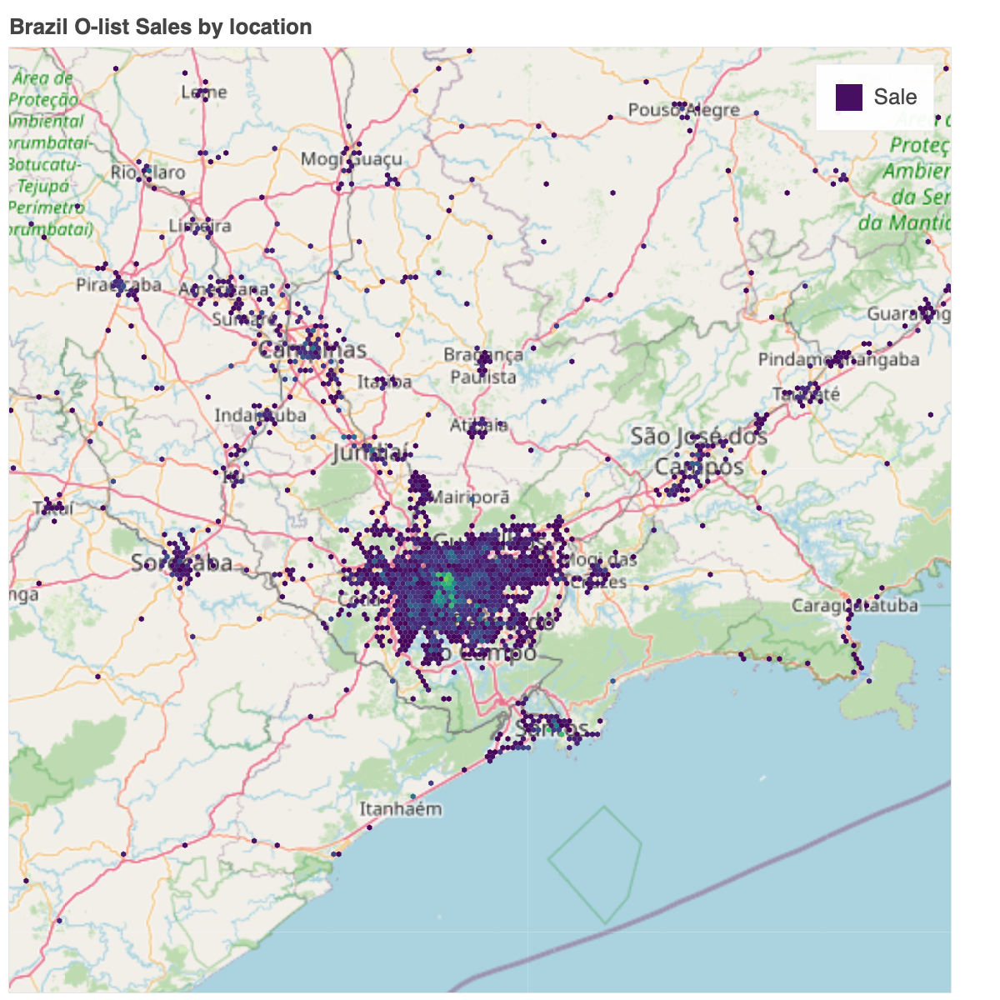

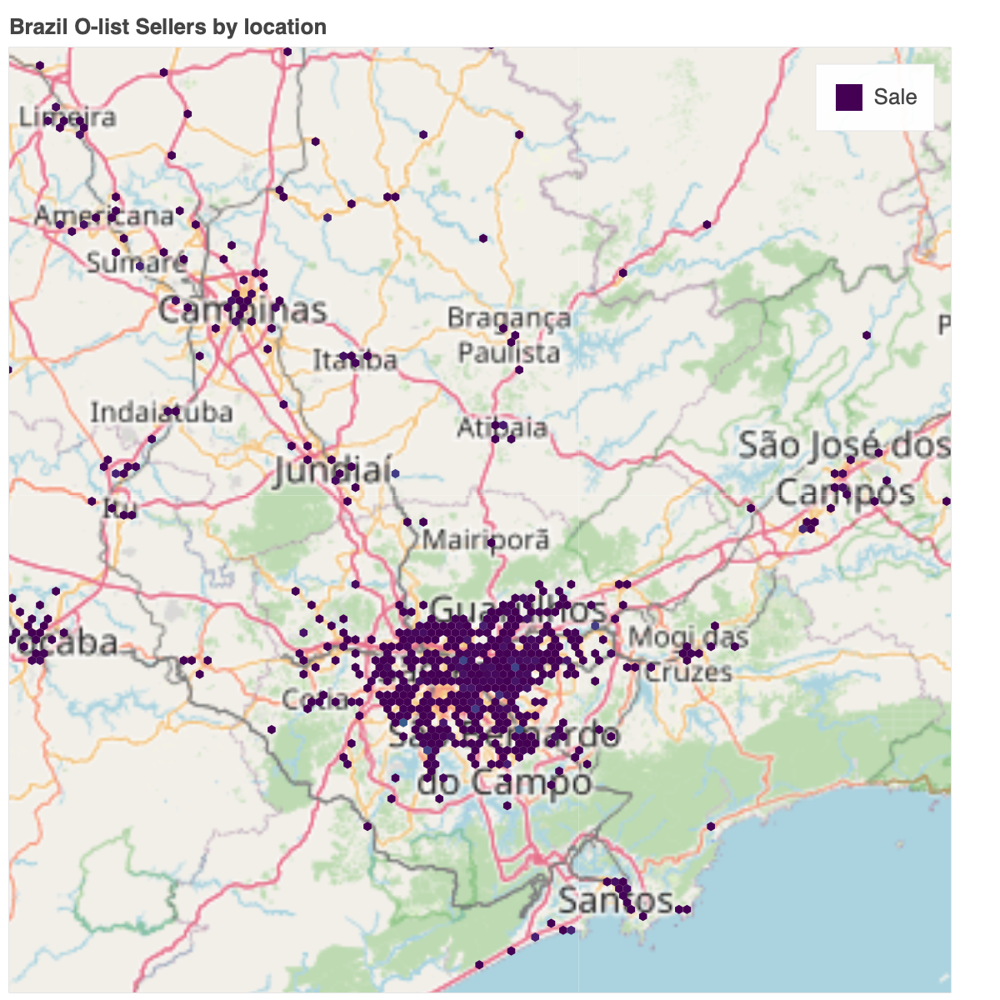

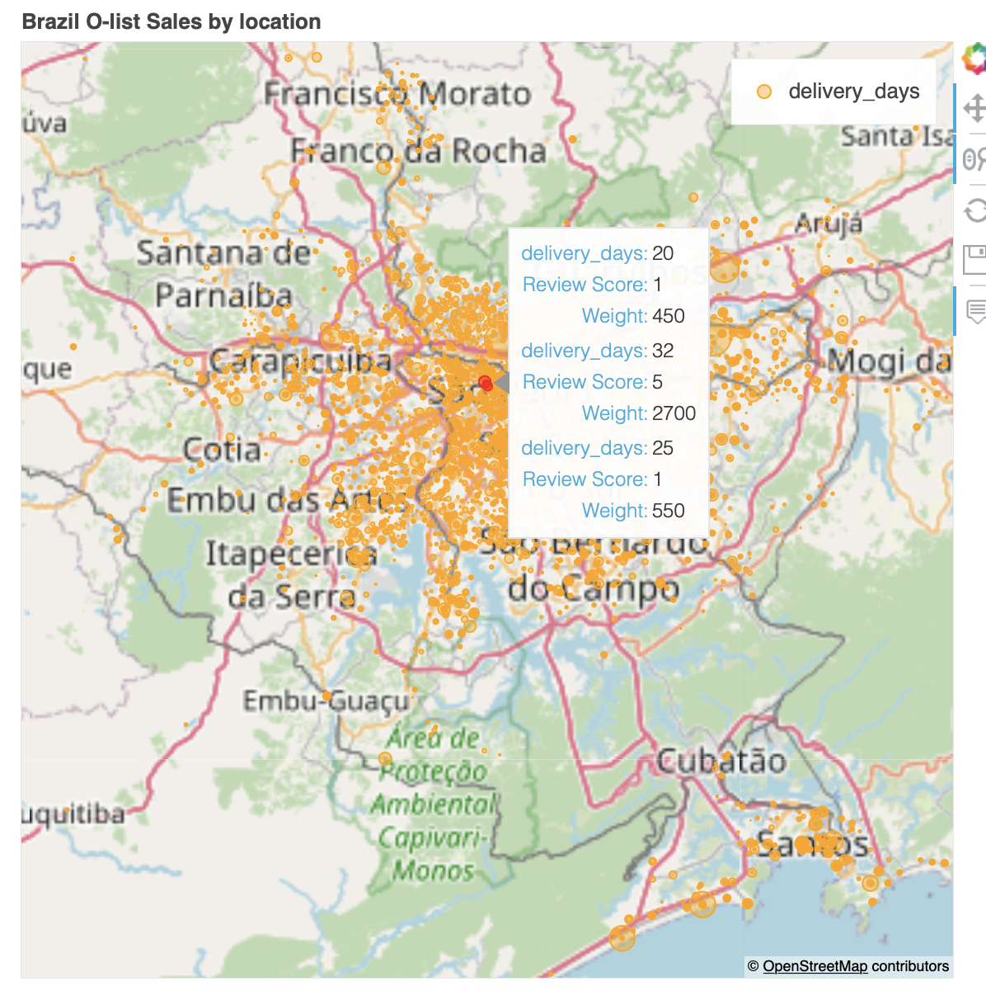

## First and Second Map : Location of buyers/sellers 

From our analysis, we can see the rough distribution of our variables and using geospatial data, we get an overview into where our sellers and buyers are located for our dataset. 

From our first and second map, we can see the exact locations of O-list deliveries by sellers and buyers. 
When zoomed out, it is apparent that most deliveries come from main cities like Sao Paulo and Rio de Janeiro, nevertheless it is also important to realise that there are clusters of deliveries made to various other cities as well (Curitiba, Joinville, Florianopolis, Londrina, Juiz de Fora, Belo Horizonte). This gives us an idea of where we could have warehouses situated, and where we can invest into more delivery services.
According to this inital plot, it would seem that it is economical to invest into delivery trucks and personnel near the main cities, and perhaps have relatively less resources invested for others. The nature and size of the resources to be invested can only be decided upon further detailed data analysis.
When zoomed into specific cities, we can understand the specific neighborhoods that attract most customers for the e-commerce business. For example, within Sao Paulo, when zoomed in, we can see the city center hexmap to be a yellowish colour. This lgihter colour indicates a higher number of sales, showing how this specific area within the city attracts most customers. This shows us that most potential and target customers live in this area.

## Third Map : Bubble Map 

We can use inbuilt functionality within the 'bokeh' module, to derive insights. From our third map, each orange bubble is actually representative of a sale, wherein the radius of the bubble is defined by the delivery days. For example if a certain order took 11 days to deliver then the bubble would be alot more bigger and noticable as compared to a bubble represenating 2 day delivery.

This helps us gain isight into the locations that tend to have longer delivery durations, because we can analyse the map to recognise locations that have larger bubbles as opposed to locations with smaller bubbles. From the map above it is apparent that locations:

1) West of Floresta da Tijura near Rio de Janeiro 

2) Saito 

3) Ribeirao Preto 

4) Salvador

## Weight

For orders with longer delivery days, it is also common for weight of the product to factor in. For example, it will take longer for distributors to deliver a wooden wardrobe as opposed to delivering a book. If you hover along the large bubbles, from the interactive legend it is also apparent that some of these deliveries are actually of heavy products. Hence for locations like North of Salvador, a longer delivery duration may be justified. 

## Review Rating

The above locations have long delivery durations, and perhaps distributors can work on increasing efficiency in these locations. Furthermore, if you hover across the bubble plots at these locations, it is also apparent that the review score for these high delivery duration orders are very low (around 1-3). This proves that longer delivery days in these locations is a factor that reduces cutomer satisfaction. 

### Multi-Variate Linear Regression 

In [42]:
dataframe

,price,freight_value,review_score,product_weight_g,customer_lat,customer_lng,Types of products,seller_lat,seller_lng,volume,year,delivery_days,estimated_days,x,y
0,29.99,8.72,4,500.0,-23.574809,-46.587471,Household,-23.680114,-46.452454,1976.0,2017,8.0,16.0,-5.171063e+06,-2.714477e+06
1,118.70,22.76,4,400.0,-12.169860,-44.988369,Fashion,-19.810119,-43.984727,4693.0,2018,14.0,20.0,-4.896357e+06,-2.250550e+06
2,159.90,19.22,5,420.0,-16.746337,-48.514624,Electronics,-21.362358,-48.232976,9576.0,2018,9.0,27.0,-5.369270e+06,-2.435139e+06
3,45.00,27.20,5,450.0,-5.767733,-35.275467,Household,-19.840168,-43.923299,6000.0,2017,14.0,27.0,-4.889519e+06,-2.254106e+06
4,19.90,8.72,5,250.0,-23.675037,-46.524784,Household,-23.551707,-46.260979,11475.0,2018,3.0,13.0,-5.149749e+06,-2.698876e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29115,108.90,11.78,5,1850.0,-23.329765,-46.721857,Electronics,-23.406238,-46.841025,5168.0,2018,2.0,8.0,-5.214319e+06,-2.681221e+06
29116,99.99,18.64,5,1400.0,-15.832476,-48.010334,Household,-22.931256,-43.178813,22500.0,2018,7.0,13.0,-4.806644e+06,-2.623707e+06
29117,37.55,16.05,5,300.0,-30.024860,-51.223432,Tools,-22.852758,-47.055102,1188.0,2017,10.0,27.0,-5.238150e+06,-2.614222e+06
29118,59.90,17.16,5,1850.0,-19.612724,-46.924422,Tools,-20.802436,-49.395624,32560.0,2017,16.0,31.0,-5.498696e+06,-2.368337e+06


### Using the original dataset for our linear regression model

Intercept of Regression 	: b =  [20.12657672]
Coefficients of Regression 	: a =  [[ 1.59965015e-01 -1.73744629e-03 -1.42375258e-05 -2.45403753e+00
  -1.18186129e-04]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.16241002148942663
Mean Squared Error (MSE) 	: 74.804688348025

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.16602491740844671
Mean Squared Error (MSE) 	: 67.55499516889284



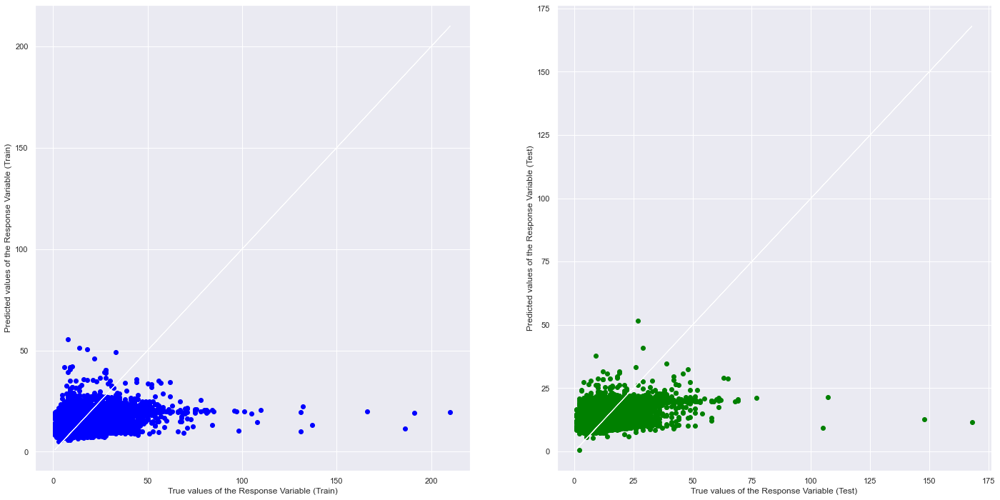

In [150]:
# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Recall the Total-HP Dataset
y = pd.DataFrame(dataframe["delivery_days"])
X = pd.DataFrame(dataframe[["freight_value","price","volume","review_score","product_weight_g"]])

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.25)

# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

### With such a low explained variance, we can try adding in more variables to try and improve our model. After which, we can remove outliers as well. From our analysis above, we can take delivery days > 50 as our anomaly and remove them from our dataset. 




In [6]:
from math import sin, cos, sqrt, atan2, radians

# approximate radius of earth in km
R = 6373.0

for i in range(0,29120):
    lat1 = radians(dataframe.loc[i,'customer_lat'])
    lon1 = radians(dataframe.loc[i,'customer_lng'])
    lat2 = radians(dataframe.loc[i,'seller_lat'])
    lon2 = radians(dataframe.loc[i,'seller_lng'])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    
    dataframe.loc[i,'distance'] = distance

### After adding another variable 'distance', which is the distance between the location of the seller and the location of the customer, we use this new dataset for our linear regression model 

Intercept of Regression 	: b =  [17.95183384]
Coefficients of Regression 	: a =  [[ 3.72207934e-03 -2.25373445e-04  1.21589087e-05 -2.28231717e+00
   1.18488772e-04  5.89804948e-03]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.2577784457126284
Mean Squared Error (MSE) 	: 65.96759103020231

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.2793322314771116
Mean Squared Error (MSE) 	: 59.30346848780457



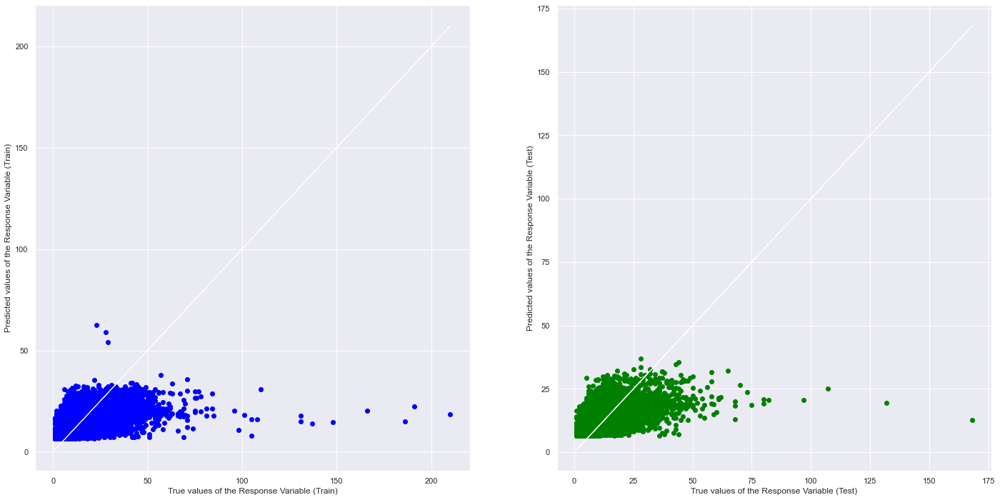

In [158]:
# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Recall the Total-HP Dataset
y = pd.DataFrame(dataframe["delivery_days"])
X = pd.DataFrame(dataframe[["freight_value","price","volume","review_score","product_weight_g","distance"]])

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.25)

# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

### The explained variance R^2 has increased due to the addition of the variable 'distance'. Now, we will remove the the outliers from the dataset.

In [7]:
df3 = dataframe[dataframe['delivery_days'] <= 50]  
df3 = df3.dropna()
df3.reset_index(drop=True,inplace=True)
df3

,price,freight_value,review_score,product_weight_g,customer_lat,customer_lng,Types of products,payment_value,seller_lat,seller_lng,volume,year,delivery_days,estimated_days,x,y,distance
0,29.99,8.72,4,500.0,-23.574809,-46.587471,Household,18.12,-23.680114,-46.452454,1976.0,2017,8.0,16.0,-5.186094e+06,-2.701682e+06,18.069507
1,118.70,22.76,4,400.0,-12.169860,-44.988369,Fashion,141.46,-19.810119,-43.984727,4693.0,2018,14.0,20.0,-5.008082e+06,-1.365046e+06,856.561389
2,159.90,19.22,5,420.0,-16.746337,-48.514624,Electronics,179.12,-21.362358,-48.232976,9576.0,2018,9.0,27.0,-5.400623e+06,-1.891317e+06,514.291730
3,45.00,27.20,5,450.0,-5.767733,-35.275467,Household,72.20,-19.840168,-43.923299,6000.0,2017,14.0,27.0,-3.926847e+06,-6.431483e+05,1823.372584
4,19.90,8.72,5,250.0,-23.675037,-46.524784,Household,28.62,-23.551707,-46.260979,11475.0,2018,3.0,13.0,-5.179115e+06,-2.713860e+06,30.183509
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28943,99.99,18.64,5,1400.0,-15.832476,-48.010334,Household,118.63,-22.931256,-43.178813,22500.0,2018,7.0,13.0,-5.344486e+06,-1.785331e+06,938.080767
28944,37.55,16.05,5,300.0,-30.024860,-51.223432,Tools,53.60,-22.852758,-47.055102,1188.0,2017,10.0,27.0,-5.702166e+06,-3.506746e+06,899.083066
28945,59.90,17.16,5,1850.0,-19.612724,-46.924422,Tools,308.24,-20.802436,-49.395624,32560.0,2017,16.0,31.0,-5.223603e+06,-2.227209e+06,289.907644
28946,115.00,17.25,4,450.0,-22.912294,-43.382198,Household,132.25,-27.209811,-49.632920,8000.0,2017,13.0,21.0,-4.829284e+06,-2.621416e+06,790.430478


Intercept of Regression 	: b =  [16.21756724]
Coefficients of Regression 	: a =  [[ 1.42729471e-02 -3.83843177e-04  4.16692651e-06 -1.91326378e+00
   1.19012057e-04  5.58419254e-03]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.2882253473443144
Mean Squared Error (MSE) 	: 46.297473122644575

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.29529587857287765
Mean Squared Error (MSE) 	: 44.956792490113045



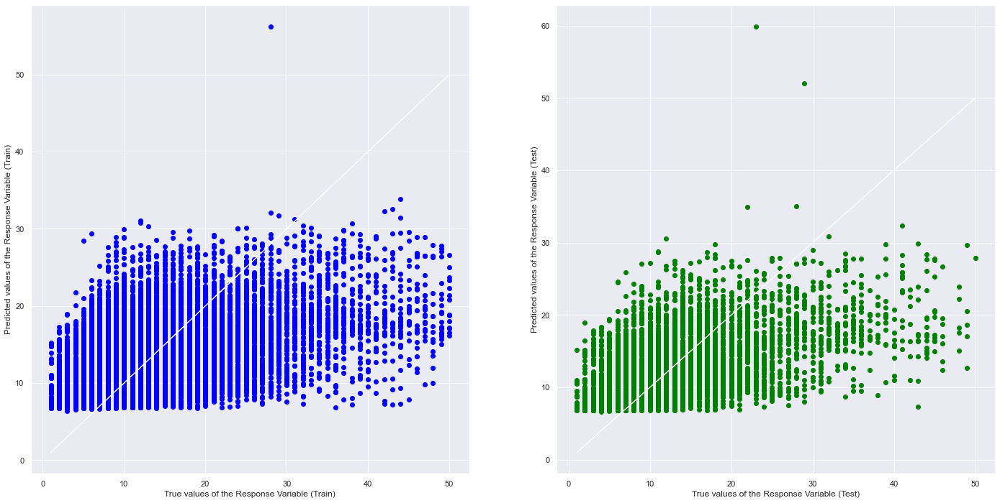

In [160]:
# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Recall the Total-HP Dataset
y = pd.DataFrame(df3["delivery_days"])
X = pd.DataFrame(df3[["freight_value","price","volume","review_score","product_weight_g","distance"]])

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.25)

# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

### As the previous linear regression model was on all of our six factors, we use the correlation matrix to find out which of the three factors affect delivery days the most. We use this new data set for the linear regression model.

In [13]:
numDF2 = pd.DataFrame(dataframe[['delivery_days','price','volume','product_weight_g','freight_value','review_score','distance']])

<AxesSubplot:>

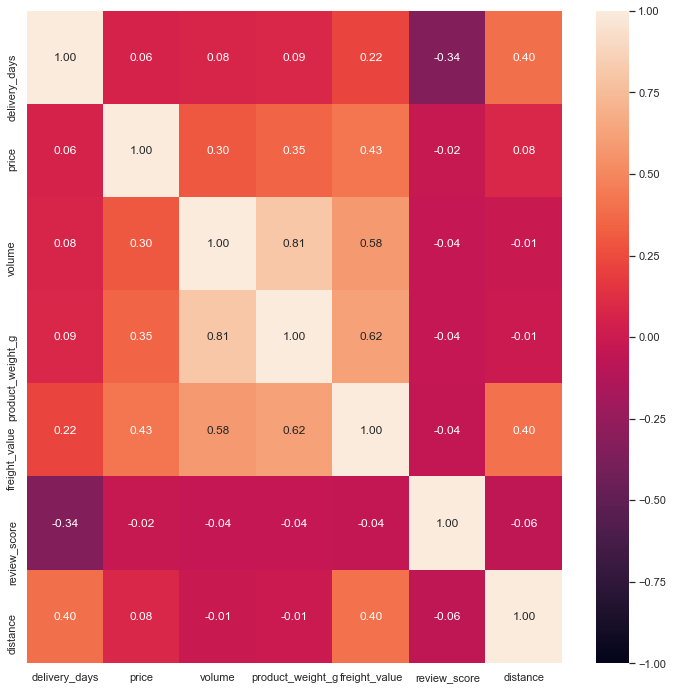

In [15]:
f = plt.figure(figsize=(12, 12))
sb.heatmap(numDF2.corr(), vmin = -1, vmax = 1, annot = True, fmt = ".2f")

### From the correlation matrix, the top three factors with the highest correlation with delivery days are freight_value, review_score and distance. Now, we will use these three factors to see whether it will improve our linear regression model.

Intercept of Regression 	: b =  [16.14320875]
Coefficients of Regression 	: a =  [[ 0.03623213 -1.8993383   0.00532808]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.28423368764326884
Mean Squared Error (MSE) 	: 45.97635782237349

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.2986423138088359
Mean Squared Error (MSE) 	: 46.452365589850984



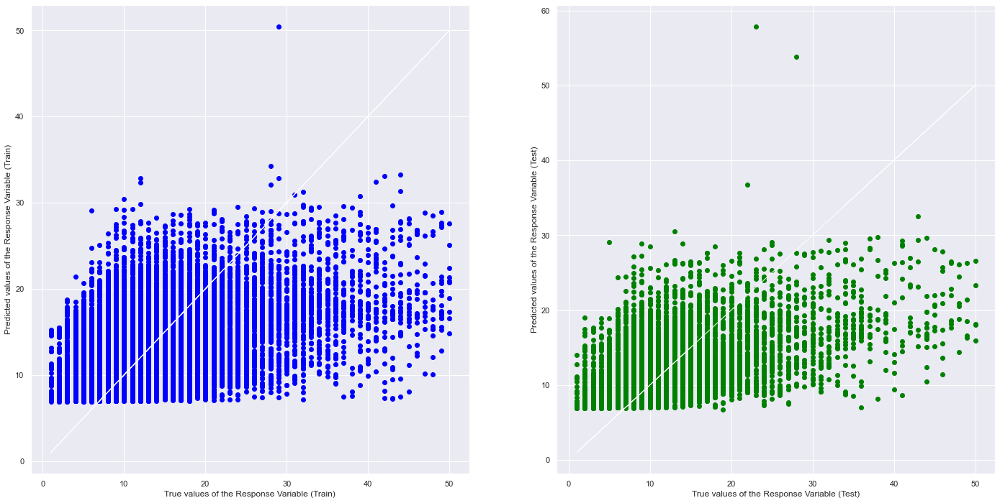

In [12]:
# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Recall the Total-HP Dataset
y = pd.DataFrame(df3["delivery_days"])
X = pd.DataFrame(df3[["freight_value","review_score","distance"]])

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.25)

# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

## Original Linear Regression Test Model 
Goodness of Fit of Model 	Train Dataset  
Explained Variance (R^2) 	: 0.16241002148942663  
Mean Squared Error (MSE) 	: 74.804688348025  

Goodness of Fit of Model 	Test Dataset  
Explained Variance (R^2) 	: 0.16602491740844671  
Mean Squared Error (MSE) 	: 67.55499516889284  

## After removing outliers and adding in a new variable, distance.
Goodness of Fit of Model 	Train Dataset  
Explained Variance (R^2) 	: 0.2882253473443144  
Mean Squared Error (MSE) 	: 46.297473122644575  

Goodness of Fit of Model 	Test Dataset  
Explained Variance (R^2) 	: 0.29529587857287765  
Mean Squared Error (MSE) 	: 44.956792490113045  

After removing outliers and adding in an extra variable distance which we calculated using the sellers' and buyers' latitude and longitude, we can see our R^2 value has increased to 0.295 and our MSE has reduced to 44.9

## After using the top three factors, 
Goodness of Fit of Model 	Train Dataset  
Explained Variance (R^2) 	: 0.28423368764326884  
Mean Squared Error (MSE) 	: 45.97635782237349  

Goodness of Fit of Model 	Test Dataset  
Explained Variance (R^2) 	: 0.2986423138088359  
Mean Squared Error (MSE) 	: 46.452365589850984  
#### The three factors improved our linear regression model

However, we still want to achieve at least a 0.5 value for our R^2. Maybe we can explore other machine learning techniques, such as Random Forest Regression.

In [11]:
numDF2 = pd.DataFrame(dataframe[['delivery_days','price','volume','product_weight_g','freight_value','review_score','distance']])

In [171]:
import matplotlib.pyplot as plt
# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score,mean_squared_error

X = numDF2.iloc[:, 1:7].values 
y = numDF2.iloc[:, 0].values 


from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)# Feature Scaling
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)
from sklearn.ensemble import RandomForestRegressor

regressor = RandomForestRegressor(n_estimators=400, random_state=0)
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)


from sklearn import metrics

print('Mean Squared Error (MSE) \t:', metrics.mean_squared_error(y_test, y_pred))
print('Explained Variance (R^2) \t:', metrics.r2_score(y_test, y_pred))

Mean Squared Error (MSE) 	: 65.41078002311431
Explained Variance (R^2) 	: 0.25920581137527954


## Using random forest regression on our dataframe with outliers removed : 

In [167]:
numDF3 = pd.DataFrame(df3[['delivery_days','price','volume','product_weight_g','freight_value','review_score','distance']])

In [174]:
import matplotlib.pyplot as plt
# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score,mean_squared_error

X = numDF3.iloc[:, 1:7].values 
y = numDF3.iloc[:, 0].values 


from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)# Feature Scaling
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)
from sklearn.ensemble import RandomForestRegressor

regressor = RandomForestRegressor(n_estimators=400, random_state=0)
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)


from sklearn import metrics

print('Mean Squared Error (MSE) \t:', metrics.mean_squared_error(y_test, y_pred))
print('Explained Variance (R^2) \t:', metrics.r2_score(y_test, y_pred))

Mean Squared Error (MSE) 	: 43.426172821697236
Explained Variance (R^2) 	: 0.33082458833016526


By using another machine learning method called Random Forest Regressor, here are the results for both methods. 

### Linear Regression ( with removed outliers and all variables included) 
Goodness of Fit of Model 
Explained Variance (R^2) 	: 0.2986423138088359  
Mean Squared Error (MSE) 	: 46.452365589850984  

### Random Forest Regressor ( with same dataset of removed outliers and all variables ) 
Mean Squared Error (MSE) 	: 43.426172821697236
Explained Variance (R^2) 	: 0.33082458833016526

We can see that the random forest regressor results in a slightly higher R^2 than Linear Regression. 
However, the random forest regressor has a higher complexity usage. Thus, with such similar R^2 values, we can use Linear Regression to estimate delivery dates based on our dataset. 


In [18]:
df3

,price,freight_value,review_score,product_weight_g,customer_lat,customer_lng,Types of products,payment_value,seller_lat,seller_lng,volume,year,delivery_days,estimated_days,x,y,distance,estimated_ML
0,29.99,8.72,4,500.0,-23.574809,-46.587471,Household,18.12,-23.680114,-46.452454,1976.0,2017,8.0,16.0,-5.186094e+06,-2.701682e+06,18.069507,8.958076
1,118.70,22.76,4,400.0,-12.169860,-44.988369,Fashion,141.46,-19.810119,-43.984727,4693.0,2018,14.0,20.0,-5.008082e+06,-1.365046e+06,856.561389,13.934326
2,159.90,19.22,5,420.0,-16.746337,-48.514624,Electronics,179.12,-21.362358,-48.232976,9576.0,2018,9.0,27.0,-5.400623e+06,-1.891317e+06,514.291730,10.083086
3,45.00,27.20,5,450.0,-5.767733,-35.275467,Household,72.20,-19.840168,-43.923299,6000.0,2017,14.0,27.0,-3.926847e+06,-6.431483e+05,1823.372584,17.347106
4,19.90,8.72,5,250.0,-23.675037,-46.524784,Household,28.62,-23.551707,-46.260979,11475.0,2018,3.0,13.0,-5.179115e+06,-2.713860e+06,30.183509,7.123282
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28943,99.99,18.64,5,1400.0,-15.832476,-48.010334,Household,118.63,-22.931256,-43.178813,22500.0,2018,7.0,13.0,-5.344486e+06,-1.785331e+06,938.080767,12.320054
28944,37.55,16.05,5,300.0,-30.024860,-51.223432,Tools,53.60,-22.852758,-47.055102,1188.0,2017,10.0,27.0,-5.702166e+06,-3.506746e+06,899.083066,12.018429
28945,59.90,17.16,5,1850.0,-19.612724,-46.924422,Tools,308.24,-20.802436,-49.395624,32560.0,2017,16.0,31.0,-5.223603e+06,-2.227209e+06,289.907644,8.812912
28946,115.00,17.25,4,450.0,-22.912294,-43.382198,Household,132.25,-27.209811,-49.632920,8000.0,2017,13.0,21.0,-4.829284e+06,-2.621416e+06,790.430478,13.382337


Here we add a new column to our dataframe called estimated_ML, which uses our model to predict the estimated days taken for delivery.

In [19]:
a =  [ 0.03623213, -1.8993383,0.00532808]

for i in range(0,28948):
    value = a[0] * df3.loc[i,'freight_value'] + a[1]*df3.loc[i,'review_score'] + a[2] * df3.loc[i,'distance'] +16.143208754
    df3.loc[i,'estimated_ML'] = value

In [17]:
df3

,price,freight_value,review_score,product_weight_g,customer_lat,customer_lng,Types of products,payment_value,seller_lat,seller_lng,volume,year,delivery_days,estimated_days,x,y,distance,estimated_ML
0,29.99,8.72,4,500.0,-23.574809,-46.587471,Household,18.12,-23.680114,-46.452454,1976.0,2017,8.0,16.0,-5.186094e+06,-2.701682e+06,18.069507,8.958076
1,118.70,22.76,4,400.0,-12.169860,-44.988369,Fashion,141.46,-19.810119,-43.984727,4693.0,2018,14.0,20.0,-5.008082e+06,-1.365046e+06,856.561389,13.934326
2,159.90,19.22,5,420.0,-16.746337,-48.514624,Electronics,179.12,-21.362358,-48.232976,9576.0,2018,9.0,27.0,-5.400623e+06,-1.891317e+06,514.291730,10.083086
3,45.00,27.20,5,450.0,-5.767733,-35.275467,Household,72.20,-19.840168,-43.923299,6000.0,2017,14.0,27.0,-3.926847e+06,-6.431483e+05,1823.372584,17.347106
4,19.90,8.72,5,250.0,-23.675037,-46.524784,Household,28.62,-23.551707,-46.260979,11475.0,2018,3.0,13.0,-5.179115e+06,-2.713860e+06,30.183509,7.123282
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28943,99.99,18.64,5,1400.0,-15.832476,-48.010334,Household,118.63,-22.931256,-43.178813,22500.0,2018,7.0,13.0,-5.344486e+06,-1.785331e+06,938.080767,12.320054
28944,37.55,16.05,5,300.0,-30.024860,-51.223432,Tools,53.60,-22.852758,-47.055102,1188.0,2017,10.0,27.0,-5.702166e+06,-3.506746e+06,899.083066,12.018429
28945,59.90,17.16,5,1850.0,-19.612724,-46.924422,Tools,308.24,-20.802436,-49.395624,32560.0,2017,16.0,31.0,-5.223603e+06,-2.227209e+06,289.907644,8.812912
28946,115.00,17.25,4,450.0,-22.912294,-43.382198,Household,132.25,-27.209811,-49.632920,8000.0,2017,13.0,21.0,-4.829284e+06,-2.621416e+06,790.430478,13.382337


In [25]:
actual_delivery = df3['delivery_days']
given_estimate = df3['estimated_days']
ML_estimate = df3['estimated_ML']

## From here on, we compare our results from the linear regression model to the estimated days given by Olist. 


,delivery_days,estimated_days
delivery_days,1.000000,0.436653
estimated_days,0.436653,1.000000


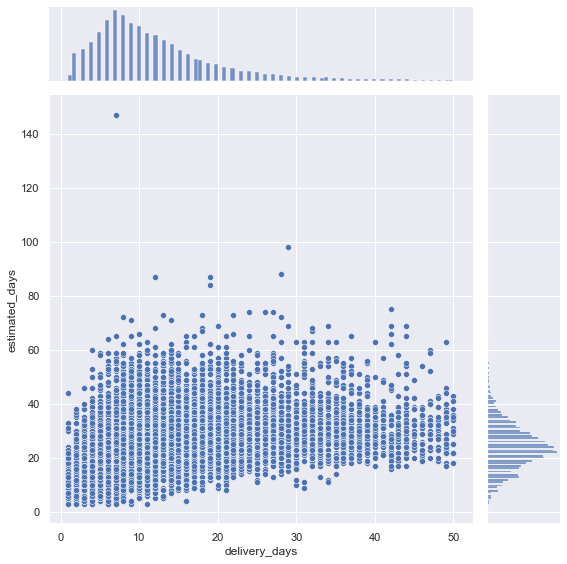

In [27]:
jointDF = pd.concat([actual_delivery,given_estimate], axis = 1)
sb.jointplot(data = jointDF, x = "delivery_days", y = "estimated_days", height = 8)
jointDF.corr()

,delivery_days,estimated_ML
delivery_days,1.000000,0.536598
estimated_ML,0.536598,1.000000


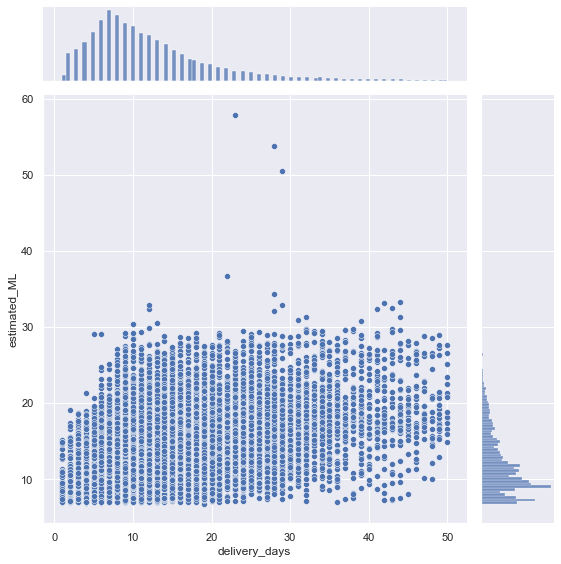

In [28]:
jointDF = pd.concat([actual_delivery,ML_estimate], axis = 1)
sb.jointplot(data = jointDF, x = "delivery_days", y = "estimated_ML", height = 8)
jointDF.corr()

In [29]:
jointDF = pd.concat([jointDF,given_estimate], axis = 1)
jointDF


,delivery_days,estimated_ML,estimated_days
0,8.0,8.958076,16.0
1,14.0,13.934326,20.0
2,9.0,10.083086,27.0
3,14.0,17.347106,27.0
4,3.0,7.123282,13.0
...,...,...,...
28943,7.0,12.320054,13.0
28944,10.0,12.018429,27.0
28945,16.0,8.812912,31.0
28946,13.0,13.382337,21.0


In [30]:
sum = 0
sum2 = 0
for i in range(0,28948):
    given_estimate_difference = abs(jointDF.loc[i,'estimated_days'] - jointDF.loc[i,'delivery_days'])
    ML_estimate_difference = abs(jointDF.loc[i,'estimated_ML'] - jointDF.loc[i,'delivery_days'])
    sum = sum + given_estimate_difference
    sum2 = sum2 + ML_estimate_difference

print("Total sum of difference between delivery days and estimated delivery days = ",sum)
print("Total sum of difference between delivery days and estimated delivery from ML =",sum2)

Total sum of difference between delivery days and estimated delivery days =  377937.0
Total sum of difference between delivery days and estimated delivery from ML = 145410.25822320714


## Conclusion
From our analysis and calculation, we have created a linear regression model based on a number of factors in order to predict delivery days taken for an order. 

Although our explained variance value is pretty low, we have managed to increase it a little by reducing outliers and introducing more variables such as distance between sellers and buyers. 

Using the linear regression model, we calculated the estimated days taken using the model and added it to our dataframe. From there, we checked the correlation between actual days, estimated days and estimated days from our model. 

As a result we found out that the values from our model actually was closer to the actual delivery days, which was more accurate than what the estimated delivery time given by Olist was. 

We also calculated the sum of difference between each of them, and the difference between actual days and estimated days was more than double of that compared to the difference between actual days and estimated values from our model. 

In conclusion, our model has done relatively well given the low R^2 value and it has already come closer than the estimate given by Olist. We also tried new techniques such as Random Forest Regression and Geospatial Analysis using Bokeh Maps. 



## Recommendation 

## 1) Olist can look into using machine learning to gauge estimated days taken better. 

Using our model with a low explained variance, we were able to predict the delivery days taken much better compared to Olist. Thus, Olist should look into improving the data they are expected to give. With better and more relistic data, there would be more transparency between the customer and the e-commerce company allowing for more cutomer satisfaction.

## 2) Increase distribution network.


Distance has highest correlation with delivery days. This suggests that when the buyer and seller are far apart the delivery takes longer. Hence o-list could work onto increasing their distribution network. If O-list were to tap into local distribution networks across the cities of Brazil, and not limit itself to delivering from cities like Rio de Janeiro and Sao Paulo it would do better with delivery time.

## 3) Create more warehouses in certain locations.


From the geospatial analysis it is apparent that there are various pockets in brazil, that have high demand for O-list products, however deliery duration is long, and hence review scores are low. Therefore, O-list could look into creating more warehouses in locations like: West of Floresta da Tijura, Saito, Ribeirao Preto, Salvador. This would allow them to deliver to more consumers, in relatively smaller times.